In [27]:
import json
import os 
import matplotlib.pyplot as plt
from PE_helper import * 
import cv2
import numpy as np
from tqdm import tqdm

def calculate_iou( gt_u,gt_vt,gt_vb ,  pred_us , pred_tops , pred_btms  , img = None):
    predictions= []
    gts= []
    gt_size = []
    debug_img = np.ascontiguousarray( img)
    
    for u , vt,vb in zip( pred_us , pred_tops , pred_btms):                                            
        #print("u " , len(u) , u)
        #print("vt " , len(vt), vt)
        #print("vb " , len(vb), vb)
        
        u = np.array(u)
        vt = np.array(vt)
        vb = np.array(vb)
        #print("pred_us" , u)
        polys =[]
        for _u , _vt , _vb in zip( u , vt , vb):
            poly = [[_u[0] , _vt[0]] , [_u[1] , _vt[1] ] , [ _u[1] , _vb[1] ] ,  [ _u[0] , _vb[0] ]   ]
            polys.append(poly)
        '''
        #polys,debug_img  = to_distorted_box(  u , vt , vb, return_mask= False , image=debug_img,
        polys  = to_distorted_box(  u , vt , vb, return_mask= False , image=debug_img,
        #polys , mask  = to_distorted_box(  u , vt , vb, return_mask= True , image=None,
                                                    seg_count=30 , show_plt=False , return_img=False , fill_color=(255,0,0))                                             
                                                    #seg_count=30 , show_plt=True , return_img=True , fill_color=(255,0,0))                                             
        '''    

        predictions.append(polys)
    
    for u , vt,vb in zip(gt_u,gt_vt,gt_vb ):
        u = np.array(u)
        vt = np.array(vt)
        vb = np.array(vb)
        #polys,debug_img  = to_distorted_box( [u],[vt],[vb] , return_mask= False ,  image=debug_img,                                       
        #polys  = to_distorted_box( [u],[vt],[vb] , return_mask= False ,  image=debug_img,                                       
        
        polys   = to_distorted_box( [u],[vt],[vb] , return_mask= False ,  image=None,                                       
                                                seg_count=30 , show_plt=False , return_img=False , fill_color=(0,255,0))            
                                                #seg_count=30 , show_plt=True , return_img=True , fill_color=(0,255,0))            
        #print("polys" , polys)
        #plt.imshow(mask)
        #plt.show()
        
        #box_size = np.count_nonzero(mask[:,:,0]) / (mask.shape[0] * mask.shape[1])
        #gt_size.append(box_size)
        #print("box_size" , box_size)
        gts.append(polys)
    
    '''
    iou_matrixs = get_iou_matrix_polygon(gts , predictions)
    iou_each_gt = np.max(iou_matrixs,axis=0)
    
    #print("iou_matrixs " , iou_matrixs)
    #print("iou_each_gt " , iou_each_gt)
    return iou_each_gt , gt_size
    '''
    return gts , predictions

naive_output_path = os.path.join(os.getcwd() , "output_log" , "detr_out_all_nms05.json")
with open(naive_output_path , "r") as f:
    naive_output = json.load(f)

helper =  PR_Eval_Helper(get_iou_fn = get_iou_matrix_polygon )

iou_thresholds = [0.05 , 0.5 , 0.75]
tp ={0.05: [] , 0.5:[] , 0.75:[]}
fp ={0.05: [] , 0.5:[] , 0.75:[]}
fn ={0.05: [] , 0.5:[] , 0.75:[]}

precision ={0.05: 0 , 0.5:0 , 0.75:0}
recall ={0.05: 0 , 0.5:0 , 0.75:0}
debug_i = 0
pred_cnt = 0
pred_gt = 0
for out in tqdm(naive_output):    
    img_path = out['img']
    #img = cv2.imread(os.path.join( ZILLOW_DATASET_FOLDER , img_path) )
    gt_us , gt_vt, gt_vb = out['gt_us'], out['gt_tops'] , out['gt_btms']
    pred_us , pred_vt, pred_vb = out['pred_us'], out['pred_tops'] , out['pred_btms']
      
    #print("len(pred_us)",len(pred_us) , pred_us)
    #iou_each_gt  , gt_size= calculate_iou( gt_us[0] , gt_vt[0], gt_vb[0]   ,  pred_us , pred_vt, pred_vb , img)
    gts , predictions= calculate_iou( gt_us[0] , gt_vt[0], gt_vb[0]   ,  pred_us , pred_vt, pred_vb ,None)
    helper.eval_batch_pr(predictions , gts)
    '''
    #out.update({"gt_iou": iou_each_gt.tolist()})
    #out.update({"gt_size": gt_size})
    for iou_threshold in iou_thresholds:
        #iou = np.array(iou_each_gt)
        #_tp = len([i for i in iou_each_gt if i>=iou_threshold])
        for iou in iou_each_gt:
            tp[iou_threshold].append(iou>iou_threshold)
            fp[iou_threshold].append(iouiou_threshold)
        #fp[iou_threshold]+= abs( len(pred_us) - _tp)
        #fn[iou_threshold]+= abs( len(gt_us) - _tp)
    pred_cnt+=len(pred_us)
    pred_gt+=len(gt_us[0])
    debug_i +=1
    if(debug_i >5):
        break
    '''
helper.get_all_pr(logger=None)
'''
print("pred_cnt" , pred_cnt)
print("pred_gt" , pred_gt)

for iou_threshold in iou_thresholds:
    precision[iou_threshold] = tp[iou_threshold] / (fp[iou_threshold] + tp[iou_threshold])
    recall[iou_threshold]  = tp[iou_threshold] / pred_gt
    print("precision" , precision[iou_threshold])
    print("recall" , recall[iou_threshold])
#print("naive_output" , naive_output)
write_path = os.path.join(os.getcwd() , "output_log" , "detr_out_all_nms05_gt_iou.json" )
with open( write_path , 'w') as f:
    json.dump(naive_output, f)

'''

  0%|          | 0/6249 [00:00<?, ?it/s]d:\Projects\Layout\NTHU_CGV_Layout_exp\Horizon_and_SAM\Horizon\PE_helper.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  all_points[:i] =   np.asarray( all_points)[sort_idx]
100%|██████████| 6249/6249 [00:21<00:00, 289.30it/s]


ap_0.05 0.6221247062130701
ap_0.5 0.23263943164992262
ap_0.75 0.04324962926753034


'\nprint("pred_cnt" , pred_cnt)\nprint("pred_gt" , pred_gt)\n\nfor iou_threshold in iou_thresholds:\n    precision[iou_threshold] = tp[iou_threshold] / (fp[iou_threshold] + tp[iou_threshold])\n    recall[iou_threshold]  = tp[iou_threshold] / pred_gt\n    print("precision" , precision[iou_threshold])\n    print("recall" , recall[iou_threshold])\n#print("naive_output" , naive_output)\nwrite_path = os.path.join(os.getcwd() , "output_log" , "detr_out_all_nms05_gt_iou.json" )\nwith open( write_path , \'w\') as f:\n    json.dump(naive_output, f)\n\n'

In [29]:
print(tp[0.5])
print(helper.all_iou/helper.gt_count)

[]
0.49311499057258057


100%|██████████| 6249/6249 [00:00<00:00, 43797.04it/s]


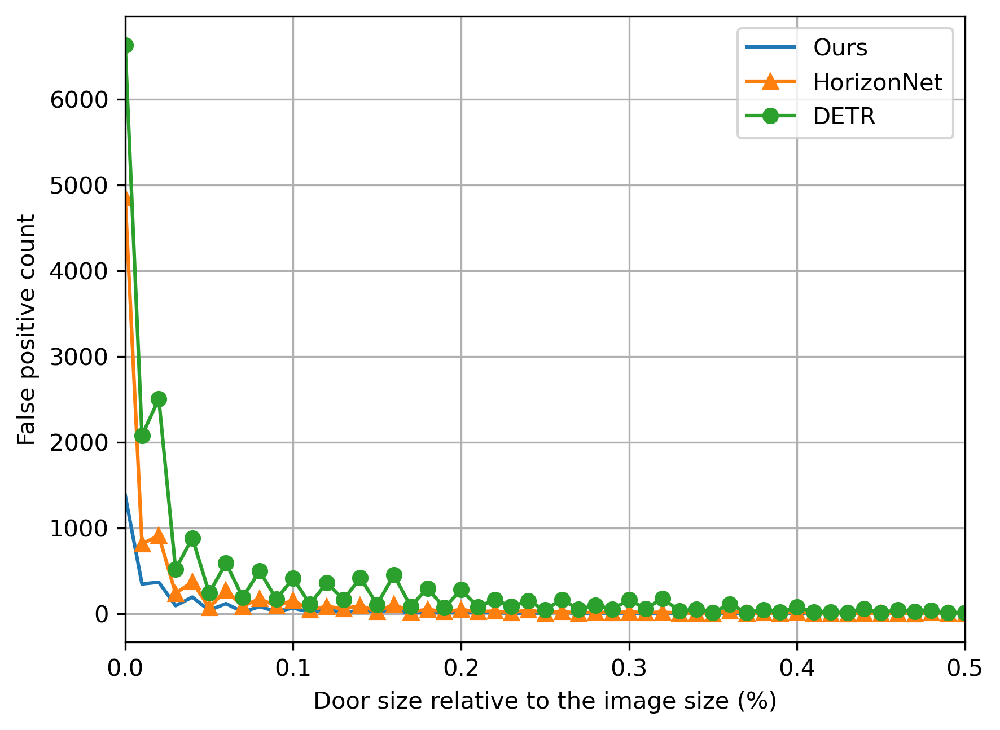

In [2]:
import json
import os 
import matplotlib.pyplot as plt
from PE_helper import * 
import cv2
import numpy as np
from tqdm import tqdm
naive_output_path = os.path.join(os.getcwd() , "output_log" , "naive_out_all_gt_iou.json")
ours_output_path = os.path.join(os.getcwd() , "output_log" , "ours_out_all_gt_iou.json")
detr_output_path = os.path.join(os.getcwd() , "output_log" , "detr_out_all_gt_iou.json")
with open(naive_output_path , "r") as f:
    naive_output = json.load(f)
with open(ours_output_path , "r") as f:
    ours_output = json.load(f)
with open(detr_output_path , "r") as f:
    detr_output = json.load(f)
    
def clamp(value, step=0.005):    
    #value = max(min_value, min(value, max_value))    
    value = np.round( round(value / step) * step , 2)
    
    return value

min_value = min(min(item['gt_size'] for item in naive_output ))
max_value = max(max(item['gt_size'] for item in naive_output ))
step_size =  0.005
clamped_min = clamp(min_value , step_size)
clamped_max = clamp(max_value , step_size)
step = int( (clamped_max - clamped_min)/step_size)


def plot_relation(output_data , label , style = "-"):
    x_axis = np.linspace(clamped_min , clamped_max ,  step+1 )
    relation_dict = {}
    counter_dict = {}
    fp_dict ={}

    for x in x_axis:
        idx = clamp(x,step_size)
        
        relation_dict[idx] = 0
        counter_dict[idx] = 1
        fp_dict[idx] = 0


    debug_i=0
    for out in tqdm(output_data):
        ious = out['gt_iou']
        sizes = out['gt_size']
        fp_count = max( len(out['pred_us']) -  np.count_nonzero( np.asanyarray(ious) >= 0.5)  , 0 )
        for size , iou in zip( sizes  , ious):
            clamped_size = clamp(size , step_size)
            relation_dict[clamped_size] += iou
            counter_dict [clamped_size] +=1
            fp_dict[clamped_size] += fp_count
        
        '''
        if(debug_i>50):
            break
        debug_i+=1
        
        '''


    x_axis = np.array(list(relation_dict.keys()))    
    #y_axis = np.array(list(relation_dict.values())) / np.array(list(counter_dict.values()))  # mIoU
    y_axis = np.array(list(fp_dict.values()))  # fp
    #print(x_axis)    
    plt.plot( x_axis , y_axis  ,style, label=label )
    plt.axis('tight')
    plt.autoscale(enable=True, axis='x', tight=True)
    
plt.figure(dpi = 300)
plot_relation(ours_output , "Ours" , "-")
plot_relation(naive_output, "HorizonNet" , "-^")
plot_relation(detr_output,"DETR" , "-o")
plt.legend()

plt.xlabel('Door size relative to the image size (%)')
#plt.ylabel('mIoU')
#plt.title('mIoU and door size relation')
plt.ylabel('False positive count')
#plt.title('False positive and door size relation')

plt.grid(True)
plt.show()


In [3]:
# Find least iou 
target_iou_threshold=0.6

naive_output_sort = sorted(naive_output ,key= lambda x: x['img'])
ours_output_sort = sorted(ours_output ,key= lambda x: x['img'])
detr_output_sort = sorted(detr_output ,key= lambda x: x['img'])

worst_detr_img = []
worst_naive_img = []
worst_datas = []
for naive , our , detr in zip(naive_output_sort , ours_output_sort , detr_output_sort):
    
    #print("naive['img']" , naive['img'])
    #print("naive['gt_iou']" , naive['gt_iou'])
    if not(len(naive['gt_iou'] ) > 0 and len(our['gt_iou'])  > 0 and  len(detr['gt_iou'])>0):
        continue
    naive_worst_iou = min(naive['gt_iou'])
    ours_worst_iou = min(our['gt_iou'])
    detr_worst_iou = min(detr['gt_iou'])
    '''
    if ours_worst_iou - naive_worst_iou > target_iou_threshold and naive_worst_iou> 0:
        worst_naive_img.append(naive['img'])
    if ours_worst_iou - detr_worst_iou > target_iou_threshold and detr_worst_iou> 0:
        worst_detr_img.append(detr['img'])
    '''
    #if ours_worst_iou - naive_worst_iou > target_iou_threshold and naive_worst_iou> 0:
    worst_datas.append(
            {
                'ours': our ,
                'naive': naive,
                'detr': detr,
            }    
        )
    #break

#print("worst_detr_img" , worst_detr_img)
#print("worst_naive_img" , worst_naive_img)
print("worst_datas" , worst_datas)

worst_datas [{'ours': {'img': '0010/panos/floor_01_partial_room_01_pano_25.jpg', 'gt_us': [[[0.589038074016571, 0.6034374833106995], [0.6633837819099426, 0.7045605182647705], [0.8326709270477295, 0.8493554592132568]]], 'gt_tops': [[[0.47124022245407104, 0.4664648473262787], [0.4495898485183716, 0.45320311188697815], [0.45924803614616394, 0.4505664110183716]]], 'gt_btms': [[[0.5989550948143005, 0.6148437261581421], [0.655029296875, 0.6450781226158142], [0.6411035060882568, 0.6673925518989563]]], 'pred_us': [[[0.587890625, 0.6016998291015625]]], 'pred_tops': [[[0.464599609375, 0.45947265625]]], 'pred_btms': [[[0.599609375, 0.6123046875]]], 'gt_iou': [0.7714322209358215], 'gt_size': [0.0020380020141601562, 0.008330345153808594, 0.003429889678955078]}, 'naive': {'img': '0010/panos/floor_01_partial_room_01_pano_25.jpg', 'gt_us': [[[0.589038074016571, 0.6034374833106995], [0.6633837819099426, 0.7045605182647705], [0.8326709270477295, 0.8493554592132568]]], 'gt_tops': [[[0.47124022245407104, 

In [13]:
# visualize
def visualize(out  , img = None , title =""):
    gt_u , gt_vt, gt_vb = out['gt_us'], out['gt_tops'] , out['gt_btms']
    pred_us , pred_vt, pred_vb = out['pred_us'], out['pred_tops'] , out['pred_btms']
    #debug_img = np.ascontiguousarray( img)    
    for u , vt,vb in zip(gt_u,gt_vt,gt_vb ):
        u = np.array(u)
        vt = np.array(vt)
        vb = np.array(vb)
        polys,debug_img  = to_distorted_box( u,vt,vb , return_mask= False ,  image=img,                                       
                                                seg_count=0 , show_plt=False , return_img=True , fill_color=(0,255,0) , thickness=3 )            
        
    for u , vt,vb in zip( pred_us , pred_vt , pred_vb):                                            
      
        u = np.array(u)
        vt = np.array(vt)
        vb = np.array(vb)
        #print("pred_us" , u)            
        polys,debug_img  = to_distorted_box(  u , vt , vb, return_mask= False , image=img,        
                                                    seg_count=0 , show_plt=False , return_img=True , fill_color=(0,0,255) , thickness=2 , dotted=True)                                             
      
    
        
    debug_img = cv2.cvtColor(debug_img , cv2.COLOR_BGR2RGB)
    plt.figure(dpi = 150)
    plt.imshow(debug_img)
    #plt.title(title)
    plt.axis('off')
    #plt.show()
    #plt.savefig(os.path.join(os.getcwd() , "output_log",f"{title}.png"),bbox_inches='tight')
    

debug_targets=['0010/panos/floor_01_partial_room_07_pano_14.jpg' ,
               '0011/panos/floor_01_partial_room_11_pano_4.jpg' ,
               '0039/panos/floor_01_partial_room_09_pano_6.jpg' ,
               '0090/panos/floor_01_partial_room_12_pano_7.jpg'  ]
#debug_targets=['0010/panos/floor_01_partial_room_01_pano_25.jpg']
target = [a for a in worst_datas if a['detr']['img'] in debug_targets]
print(target)
#for i , data in enumerate(worst_datas):
for i , data in enumerate(target):
    naive , our , detr = data['naive'] , data['ours'] , data['detr'] 
    
    img_path = naive['img']
    #print(os.path.join( ZILLOW_DATASET_FOLDER , img_path))
    
    img = cv2.imread(os.path.join( ZILLOW_DATASET_FOLDER , img_path) )
    #visualize(naive , img.copy() , "naive"+img_path)
    #visualize(our , img.copy() , "our"+img_path)
    #visualize(detr , img.copy() , "detr"+img_path)
    visualize(naive , img.copy() , f"horizon_{img_path[:4]}" )
    visualize(our , img.copy(), f"ours_{img_path[:4]}"  )
    visualize(detr , img.copy(), f"detr_{img_path[:4]}"  )

    if i >20:
        break
    


[{'ours': {'img': '0010/panos/floor_01_partial_room_07_pano_14.jpg', 'gt_us': [[[0.22568847239017487, 0.26454102993011475], [0.4798583984375, 0.5190136432647705], [0.7769970893859863, 0.788647472858429]]], 'gt_tops': [[[0.4632617235183716, 0.4630468785762787], [0.4542187452316284, 0.4542480409145355], [0.4854199290275574, 0.48563477396965027]]], 'gt_btms': [[[0.6275585889816284, 0.6282519698143005], [0.6416601538658142, 0.6415820121765137], [0.5455663800239563, 0.5448437333106995]]], 'pred_us': [[[0.2177734375, 0.258087158203125]], [[0.4814453125, 0.52215576171875]], [[0.7744140625, 0.787353515625]]], 'pred_tops': [[[0.4580078125, 0.45849609375]], [[0.451904296875, 0.453369140625]], [[0.486328125, 0.484619140625]]], 'pred_btms': [[[0.6259765625, 0.62353515625]], [[0.6484375, 0.640625]], [[0.5478515625, 0.544921875]]], 'gt_iou': [0.6635982990264893, 0.8678881525993347, 0.7131267189979553], 'gt_size': [0.006492137908935547, 0.007483959197998047, 0.0007376670837402344]}, 'naive': {'img': 

IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

In [5]:
a = [0.5,0.1,0.7]
b = np.count_nonzero( np.asanyarray(a) > 0.5)
print(b)

1


In [6]:
a = int(0.000529 / 0.0005) * 0.0005
b = np.round( int(0.429 / 0.00005) * 0.00005 ,5 )
print(a)
print(b)

0.0005
0.429
